## Раздел 0. Импорт нужных и ненужных библиотек

In [773]:
import numpy as np
import pandas as pd
import random

import scipy.stats as sts
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

from scipy.stats import pearsonr, spearmanr, kendalltau

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve, accuracy_score, fbeta_score

from sklearn.preprocessing import OneHotEncoder, StandardScaler, Normalizer, MinMaxScaler, minmax_scale, PowerTransformer, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score 

from sklearn.feature_selection import f_regression, SelectKBest, f_classif, chi2, mutual_info_regression, SequentialFeatureSelector
from mlxtend.feature_selection import ExhaustiveFeatureSelector

import chart_studio.plotly as py
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings("ignore")

## Раздел 1. Сбор данных

In [774]:
data = pd.read_csv('data.csv', sep=';')
print(data.shape)
data.head()

(59034, 29)


,Местное время в Москве (ВДНХ),T,Po,P,Pa,U,DD,Ff,ff10,ff3,...,Cm,Ch,VV,Td,RRR,tR,E,Tg,E',sss
08.05.2023 09:00,8.0,761.1,775.0,0.5,46.0,"Ветер, дующий с северо-северо-востока",1.0,NaN,NaN,Облаков нет.,...,NaN,20.0,-3.1,Осадков нет,12.0,Поверхность почвы влажная.,-1.0,NaN,NaN,NaN
08.05.2023 06:00,0.7,760.6,774.9,0.8,85.0,"Штиль, безветрие",0.0,NaN,NaN,Облаков нет.,...,NaN,20.0,-1.6,Осадков нет,12.0,NaN,NaN,NaN,NaN,NaN
08.05.2023 03:00,-0.6,759.8,774.2,0.4,83.0,"Штиль, безветрие",0.0,NaN,NaN,Облаков нет.,...,NaN,20.0,-3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
08.05.2023 00:00,1.3,759.4,773.7,0.8,76.0,"Штиль, безветрие",0.0,NaN,NaN,50%.,...,"Перистых, перисто-кучевых или перисто-слоистых...",20.0,-2.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
07.05.2023 21:00,5.7,758.6,772.6,0.7,46.0,"Ветер, дующий с западо-северо-запада",1.0,NaN,NaN,60%.,...,"Перистых, перисто-кучевых или перисто-слоистых...",20.0,-5.2,Осадков нет,12.0,NaN,NaN,NaN,NaN,NaN


Никакого парсинга нет, просто гружу готовый датасет [отсюда](https://rp5.ru/%D0%90%D1%80%D1%85%D0%B8%D0%B2_%D0%BF%D0%BE%D0%B3%D0%BE%D0%B4%D1%8B_%D0%B2_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D0%B5_(%D0%92%D0%94%D0%9D%D0%A5)). Это самый подробный архив метеонаблюдений по Москве, наблюдения из него беру с мая 2006 года, чтобы получилось 17 лет. 

## Раздел 2. Предварительная обработка и описание данных

Как видно из data.shape, в этих данных целых 29 столбцов-признаков не включая индексы (названия столбцов смещены на 1 вправо, например колонка Т показыает не температуру, а давление и т.д.), а наблюдений почти 60 тысяч. Пока не понятно, какие из этих 29 признаков информативны, будем разбираться. Для начала, уберем смещение стобцов.

In [775]:
columns = data.columns
data.reset_index(inplace=True) #один раз запускать

In [776]:
data = data.drop('sss', axis=1) #один раз запускать

In [777]:
data.columns = columns

Теперь посмотрим на типы данных.

In [778]:
data.dtypes

Местное время в Москве (ВДНХ)     object
T                                float64
Po                               float64
P                                float64
Pa                               float64
U                                float64
DD                                object
Ff                               float64
ff10                             float64
ff3                              float64
N                                 object
WW                                object
W1                                object
W2                                object
Tn                               float64
Tx                               float64
Cl                                object
Nh                                object
H                                 object
Cm                                object
Ch                                object
VV                                object
Td                               float64
RRR                               object
tR              

Как видно, встречаются как численные, так и категориальные переменные, у времени тип object, поменяем на datetime. Названия столбцов непонятные (только, если ты не метеоролог, а я - нет), их тоже переименую для ясности (делать это буду после удаления ненужных столбцов).

In [779]:
data['Местное время в Москве (ВДНХ)'] = pd.to_datetime(data['Местное время в Москве (ВДНХ)'], dayfirst=True) #float to datetime
data = data.set_index('Местное время в Москве (ВДНХ)') #опять делаем время индексом

Теперь глянем на индексы : по ним видно, что каждый день разделен на 8 промежутков, по 3 часа каждый. Это верно для всех дней кроме последних наблюдений за 8 мая 2023 года (очевидно, я только сейчас начал делать проект), поэтому я удалю эти строки, чтобы потом было проще объединять наблюдения по дням (ну и просто для красоты).

In [780]:
data = data[4:]

Теперь, когда данные немного причесаны, можно посмотреть что там по нулям и нформативности.

In [781]:
data.isnull().sum()

T           6
Po        166
P         133
Pa      19908
U          41
DD         49
Ff         49
ff10    58844
ff3     57664
N        3725
WW          0
W1      31850
W2      31850
Tn      48944
Tx      52846
Cl      14266
Nh      12032
H       12015
Cm      30616
Ch      33827
VV      24292
Td         34
RRR     40413
tR      40412
E       56379
Tg      56930
E'      56706
sss     56908
dtype: int64

Да, тут явно придется повозиться. Буду идти по порядку с последнего столбца. Столбец sss, или по-русски высота снежного покрова. Ясное дело снег лежит не круглый год, поэтому много пропусков, ко всему прочему в снежные дни замер делался лишь 1 раз из 8 дневных наблюдений, что также увеличивает количество нулей. И еще тип почему-то object. Короче, инфа интересная, буду исправлять. Но перед этим внедрю чудо pandas - мультииндексы (можно было просто столбцы добавить, но это не эстетично), чтобы я мог адекватно агрегировать данные по дням, месяцам и т.д., так как иначе, агрегацмя была бы, например, по вообще всем дням, а не тем, что мне нужны.

In [782]:
data = data.set_index([data.index.year, data.index.month, data.index.day, data.index.hour]) #собственно, чудо мультииндексации
data.index.rename(['year', 'month', 'day', 'hour'], inplace= True ) 

Ранее я писал, что день разделен на 8 промежутков, однако, это не так. Почему-то, в какие-то дни замеры делались каждый час, что, очевидно, очень мешает агрегации данных (к счастью я это заметил не слишком поздно). Поэтому, пришло время избавиться от этих надоедливых часов и объединить все наблюдения по дням. Агрегация численных данных не составляет труда, а вот категориальные заставят попотеть. Начну с объединения числовых параметров и сразу же выкину бессмысленные столбцы: 1) T, Po, P - температура, давление на станции, давление усредененное к уровню моря - отличные данные, объединять буду с помощью mean + заполню пропуски средним по дням. 

In [783]:
data['T'].fillna(data.groupby(['year', 'month', 'day'])['T'].mean(), inplace=True) #боже, как это удобно, можно для разных дней заполнять средние значения для этих конкретных дней!!
data['Po'].fillna(data.groupby(['year', 'month', 'day'])['Po'].mean(), inplace=True)
data['P'].fillna(data.groupby(['year', 'month', 'day'])['P'].mean(), inplace=True)

2)Pa - барическая тенденция или изменение атмосферного давления - не нужно, можно руками по столбцу P посчитать 3) U - относительная влажность на высоте 2 метра - круто, оставляем, объединять буду с помощью mean + заполню пропуски средним по дням.

In [784]:
data['U'].fillna(data.groupby(['year', 'month', 'day'])['U'].mean(), inplace=True)

4)Ff - скорость ветра на высоте 10-12 метров усредненная за 10 минут наблюдений - хорошие данные, объединять буду с помощью mean 

In [785]:
data['Ff'].fillna(data.groupby(['year', 'month', 'day'])['Ff'].mean(), inplace=True)

5)ff10 и ff3 - максимальное значение порывов ветра на высоте 10-12 метров за 10 минут и 3-х часовой период соответственно - наблюдений мало, видимо забивали на замеры пиков скоростей ветра, выкидываем 6) N - общая облачность. Данные прикольные, но пишет, что тип object, смотрим

In [786]:
data['N'].unique()

array(['60%.', '70 – 80%.', 'Облаков нет.', '90  или более, но не 100%',
       '100%.', '50%.', '40%.', '20–30%.', '10%  или менее, но не 0', nan,
       'Небо не видно из-за тумана и/или других метеорологических явлений.'],
      dtype=object)

Ну да, конечно, нельзя просто написать процент, нужно еще характеристику добавить. Поменяем все на числа.

In [787]:
data['N'].replace('60%.', 60, inplace=True)
data['N'].replace('70 – 80%.', 75, inplace=True) #среднее
data['N'].replace('90  или более, но не 100%', 95, inplace=True) #среднее
data['N'].replace('100%.', 100, inplace=True)
data['N'].replace('50%.', 50, inplace=True)
data['N'].replace('40%.', 40, inplace=True)
data['N'].replace('20–30%.', 25, inplace=True) #среднее
data['N'].replace('10%  или менее, но не 0', 5, inplace=True) #среднее
data['N'].replace('Облаков нет.', 0, inplace=True)
data['N'].replace('Небо не видно из-за тумана и/или других метеорологических явлений.', 0, inplace=True)#допущение, но лучше так

In [788]:
data['N'] = data['N'].astype(float) #теперь можно поменять тип на float
data['N'].fillna(data.groupby(['year', 'month', 'day'])['N'].mean(), inplace=True)

7)Tn и Тх - минимальная и максимальная температуры. Хорошая инфа, только объединять надо будет не функцией mean, а min и max. 

In [789]:
data['Tn'].fillna(data.groupby(['year', 'month', 'day'])['Tn'].mean(), inplace=True)
data['Tx'].fillna(data.groupby(['year', 'month', 'day'])['Tx'].mean(), inplace=True)

8)Nh - количество всех наблюдающихся облаков, столбец почти полностью совпадает с N, но можно оставить. Обработка аналогична N 

In [790]:
data['Nh'].unique()

array(['60%.', '40%.', '50%.', '70 – 80%.', nan, '20–30%.',
       '90  или более, но не 100%', '100%.', 'Облаков нет.',
       '10%  или менее, но не 0'], dtype=object)

In [791]:
data['Nh'].replace('60%.', 60, inplace=True)
data['Nh'].replace('70 – 80%.', 75, inplace=True) #среднее
data['Nh'].replace('90  или более, но не 100%', 95, inplace=True) #среднее
data['Nh'].replace('100%.', 100, inplace=True)
data['Nh'].replace('50%.', 50, inplace=True)
data['Nh'].replace('40%.', 40, inplace=True)
data['Nh'].replace('20–30%.', 25, inplace=True) #среднее
data['Nh'].replace('10%  или менее, но не 0', 5, inplace=True) #среднее
data['Nh'].replace('Облаков нет.', 0, inplace=True)

In [792]:
data['Nh'] = data['Nh'].astype(float) #теперь можно поменять тип на float
data['Nh'].fillna(data.groupby(['year', 'month', 'day'])['N'].min(), inplace=True)

9)H - высота основания самых низких облаков, объясняю, когда добавляю категориальные данные 10)VV - горизонтальная дальность видимости (км), нормальные данные, пусть будут. Поменяем тип, заполним пропуски средними по дням

In [793]:
data['VV'].unique()

array(['20.0', '19.0', '16.0', '10.0', '8.0', '13.0', '17.0', '7.0',
       '18.0', '14.0', '6.0', '9.0', '11.0', '15.0', '12.0', '4.3', '2.8',
       '4.7', '4.9', '4.4', '4.1', '1.8', '2.4', '1.1', '2.3', '3.5',
       '3.9', '2.9', '2.5', '3.8', '2.6', '1.5', '4.0', '5.0', '2.1',
       '0.9', '2.2', '4.2', '3.0', '1.4', '4.8', '1.7', '1.0', nan, '1.9',
       '2.7', '3.2', '2.0', '4.5', '1.3', '3.6', '1.2', '4.6', '0.6',
       '3.4', '1.6', '3.7', '0.3', '3.1', '0.5', '3.3', '0.4',
       'менее 0.1', '0.2', '50.0', '0.05', '70.0'], dtype=object)

In [794]:
data['VV'].replace('менее 0.1', 0, inplace=True)
data['VV'] = data['VV'].astype(float)
data['VV'].fillna(data.groupby(['year', 'month', 'day'])['VV'].mean(), inplace=True)

11)Td - температура (градусы Цельсия) точки росы на высоте 2м от земли, пойдет

In [795]:
data['Td'].fillna(data.groupby(['year', 'month', 'day'])['Td'].mean(), inplace=True)

12)RRR - количество выпавших осадков (мм), хорошие данные, тип поменяем, итогово по дням суммировать буду, пустоты нулями заполняю

In [796]:
data['RRR'].unique()

array(['Осадков нет', nan, '0.3', 'Следы осадков', '0.2', '3.0', '6.0',
       '12.0', '8.0', '0.8', '2.0', '0.1', '0.9', '1.0', '4.0', '0.7',
       '0.5', '0.6', '5.0', '10.0', '7.0', '15.0', '14.0', '0.4', '9.0',
       '13.0', '11.0', '17.0', '19.0', '42.0', '22.0', '21.0', '25.0',
       '31.0', '16.0', '20.0', '32.0', '30.0', '29.0', '48.0', '18.0',
       '41.0', '23.0', '37.0', '24.0', '28.0', '65.0', '53.0', '40.0',
       '38.0', '26.0', '35.0', '34.0', '51.0', '27.0', '101.0'],
      dtype=object)

In [797]:
data['RRR'].replace(['Осадков нет', 'Следы осадков'], 0, inplace=True)
data['RRR'] = data['RRR'].astype(float)
data['RRR'].fillna(0, inplace=True)

13)Tr - время, за которое осадки накопились - остой, удаляем. 14) Tg - минимальная температура земли за ночь - почти не измеряли, удаляем 15)Наконец, с чего начали sss - толщина снежного покрова, работаем

In [798]:
data['sss'].unique()

array([nan, '1.0', 'Менее 0.5', '5.0', '9.0', '12.0', '18.0', '22.0',
       '24.0', '25.0', '26.0', '27.0', '28.0', '31.0', '37.0', '40.0',
       '38.0', '39.0', '42.0', '41.0', '36.0', '35.0', '34.0', '30.0',
       '33.0', '29.0', '23.0', '32.0', '21.0', '16.0', '20.0', '6.0',
       '4.0', '7.0', '11.0', '10.0', '8.0',
       'Снежный покров не постоянный.', '19.0', '13.0', '14.0', '15.0',
       '17.0', '43.0', '45.0', '47.0', '49.0', '48.0', '46.0', '3.0',
       '2.0', 'Измерение невозможно или неточно.', '44.0', '54.0', '57.0',
       '56.0', '53.0', '52.0', '55.0', '58.0', '59.0', '50.0', '51.0',
       '65.0', '69.0', '63.0', '67.0', '71.0', '74.0', '77.0', '70.0',
       '60.0', '62.0', '61.0', '97.0', '0.0', '66.0'], dtype=object)

In [799]:
data['sss'].replace(['Менее 0.5', 'Снежный покров не постоянный.', 'Измерение невозможно или неточно.'], 0, inplace=True)
data['sss'] = data['sss'].astype(float) #теперь можно поменять тип на float
data['sss'].fillna(data.groupby(['year', 'month', 'day'])['sss'].max(), inplace=True) #для дней со снегом теперь ввезде одинаково снега
data['sss'].fillna(0, inplace=True) #дни без снега безде нули

По итогу вышло 13 числовых параметров, которые теперь я буду объединять по дням в соответствии с логикой признака. Так, первые 10 признаков объединяю по среднему значению за день, Tn по минимуму за день, Tх по максимуму за день, RRR по сумме за день

In [800]:
num_columns = ['T', 'Po', 'P', 'U', 'Ff', 'N', 'Nh', 'Td', 'sss', 'Tn', 'Tx', 'RRR', 'VV']

In [801]:
numdata = data.groupby(['year', 'month', 'day'])[num_columns[0:10]].mean()
numdata_min = data.groupby(['year', 'month', 'day'])[num_columns[10:11]].min()
numdata_max = data.groupby(['year', 'month', 'day'])[num_columns[11:12]].max()
numdata_sum = data.groupby(['year', 'month', 'day'])[num_columns[12:13]].sum()
numdata = numdata.merge(numdata_min, how='outer', left_index=True, 
                        right_index=True).merge(numdata_max, how='outer', left_index=True, 
                        right_index=True).merge(numdata_sum, how='outer', left_index=True, right_index=True)

In [802]:
numdata.head() #таблица реверснулась и теперь задом наперед, пойдет

T          Po           P          U     Ff  \
year month day                                                        
2006 5     8     8.737500  752.037500  766.350000  75.500000  1.750   
           9     9.212500  748.350000  762.562500  75.250000  0.875   
           10   11.387500  744.025000  758.000000  92.000000  1.500   
           11   10.962500  741.050000  755.012500  82.500000  0.625   
           12    9.957143  744.628571  758.757143  86.285714  1.000   

                        N         Nh         Td  sss   Tn    Tx  RRR  \
year month day                                                         
2006 5     8    45.000000  38.750000   4.450000  0.0  3.2  14.0  0.0   
           9    47.500000  41.250000   4.662500  0.0  1.5  14.9  0.5   
           10   96.875000  93.750000  10.075000  0.0  9.7  14.3  2.0   
           11   80.625000  58.125000   7.925000  0.0  6.0  13.9  1.0   
           12   99.285714  99.285714   7.728571  0.0  8.8  11.9  0.7   

                       VV  
year month day             
2006 5     8    72.000000  
           9    56.000000  
           10   41.600000  
           11   61.333333  
           12   49.000000

Какая хорошая таблица вышла, посмотрим, что там по пропускам

In [803]:
numdata.isnull().sum()

T       0
Po      0
P       0
U       0
Ff      2
N       0
Nh      0
Td      0
sss     0
Tn     17
Tx     31
RRR     0
VV      0
dtype: int64

Наличие нулей означет, что в какие-то дни определенных наблюдений вообще не было (например вообще не замеряли скорость ветра), поэтому fillna, заполняющий пропуски в днях с хоть какими-то значениями не заполнил их. Поэтому запустим fillna, заполнив пустоты уже средним по месяцу.

In [804]:
numdata['Ff'].fillna(data.groupby(['year', 'month'])['Ff'].mean(), inplace=True) 
numdata['Tn'].fillna(data.groupby(['year', 'month'])['Tn'].mean(), inplace=True) 
numdata['Tx'].fillna(data.groupby(['year', 'month'])['Tx'].mean(), inplace=True) 

Все, теперь числовые данные хороши, они сгруппированы по дням (хотя исходная таблица data тоже стала почти полной по данным, мб потом пригодится), несут в себе хорошую информацию, не имеют пропусков и вообще молодцы. Теперь надо что-то решать с категориальными данными. Просто взять среднее за день по ним нельзя, может выйдет сгруппировать по самым частым строкам за день или типо того. Для начала выберем категориальные столбцы. 

1)DD - направление ветра на высоте 10-12 метров. Ветер имеет свойство менять направление, поэтому возможно, агрегация этого параметра за день посредством выбора самого популярного направления ветра не совсем верно, но, ничего не поделать. Для агрегации не подойдут обычные методы groupby, поэтому пишем крутую кастомную функцию. На вход она будет получать таблицу за какой-то день и название стобца, а на выходе говорить самую частую строку в этом столбце

In [805]:
len(data['DD'].unique()) #нормально, не очень много признаков

19

In [806]:
def most_common_value(x, column):
    if (len(x[column].value_counts()) > 0):#помним, что есть дни когда наблюдений вообще нет
        result = {column: x[column].value_counts().idxmax()}
    else: result = {column:np.nan}
    return pd.Series(result)

In [807]:
DDdata = data.groupby(['year', 'month', 'day']).apply(lambda x: most_common_value(x, 'DD')) #уфф что за код

In [808]:
DDdata.fillna(data.groupby(['year', 'month']).apply(lambda x: most_common_value(x, 'DD')), inplace=True)
#помним про пропуски и заполняем их самым популярным ветром за месяц 

Дальше пойдет полегче, т.к. весь инструментарий уже готов. 2) WW, WW1, WW2 - характеристика текущей погоды и погоды между наблюдениями 1 и 2. Непонятно зачем, но вместо nan-ов тут стоят ' ' вот такие пробелы, что не дает нормально юзнуть fillna + очень много различных значений, что сделает мою агрегацию очень бестолковой - убираем все три столбца. 3) Cl - слоисто-кучевые, слоистые, кучевые и кучево-дождевые облака, оставляем.

In [809]:
len(data['Cl'].unique()) #нормально, не очень много признаков

11

In [810]:
Cldata = data.groupby(['year', 'month', 'day']).apply(lambda x: most_common_value(x, 'Cl'))

In [811]:
Cldata.fillna('Слоисто-кучевых, слоистых, кучевых или кучево-дождевых облаков нет.', inplace=True) #если записей нет, то облаков тоже нет

4)Cm, Ch - высококучевые, высокослоистые, слоисто-дождевые облака и перистые, перисто-слоистые, перисто-кучевые облака. Не берем, при агрегации по дням данные об обычных и высоких облаках будут наслаиваться, искажая смысл, т.к. по идее они не должны идти вместе (поэтому убрал стобец H с высотой самых низких облаков, т.к. облака различать не придется) 5) E - состояние земли без снега и льда, в числовых данных осадки есть, оставим и этот признак

In [812]:
len(data['E'].unique()) #ок

8

In [813]:
Edata = data.groupby(['year', 'month', 'day']).apply(lambda x: most_common_value(x, 'E'))

In [814]:
Edata.fillna('Осадков нет', inplace=True)

6)Последний признак E', характеризующий "сорт" снега и льда на почве, пойдет

In [815]:
name = "E'"
len(data[name].unique())#ок

8

In [816]:
E1data = data.groupby(['year', 'month', 'day']).apply(lambda x: most_common_value(x, name))

In [817]:
E1data[name].fillna('снега нет', inplace=True)

In [818]:
cat_columns = ['DD', 'Cl', 'E', "E'"]

Finally, объединим все вместе.

In [819]:
daydata = numdata.merge(DDdata, how='outer', 
                        left_index=True, right_index=True).merge(Cldata, how='outer', 
                        left_index=True, right_index=True).merge(Edata, how='outer', 
                        left_index=True, right_index=True).merge(E1data, how='outer', left_index=True, right_index=True)

In [820]:
daydata.head()

T          Po           P          U     Ff  \
year month day                                                        
2006 5     8     8.737500  752.037500  766.350000  75.500000  1.750   
           9     9.212500  748.350000  762.562500  75.250000  0.875   
           10   11.387500  744.025000  758.000000  92.000000  1.500   
           11   10.962500  741.050000  755.012500  82.500000  0.625   
           12    9.957143  744.628571  758.757143  86.285714  1.000   

                        N         Nh         Td  sss   Tn    Tx  RRR  \
year month day                                                         
2006 5     8    45.000000  38.750000   4.450000  0.0  3.2  14.0  0.0   
           9    47.500000  41.250000   4.662500  0.0  1.5  14.9  0.5   
           10   96.875000  93.750000  10.075000  0.0  9.7  14.3  2.0   
           11   80.625000  58.125000   7.925000  0.0  6.0  13.9  1.0   
           12   99.285714  99.285714   7.728571  0.0  8.8  11.9  0.7   

                       VV                                    DD  \
year month day                                                    
2006 5     8    72.000000  Ветер, дующий с северо-северо-запада   
           9    56.000000        Ветер, дующий с северо-востока   
           10   41.600000               Ветер, дующий с востока   
           11   61.333333                      Штиль, безветрие   
           12   49.000000         Ветер, дующий с северо-запада   

                                                               Cl  \
year month day                                                      
2006 5     8    Кучевые и слоисто-кучевые (но не слоисто-кучев...   
           9          Слоисто-кучевые, образовавшиеся из кучевых.   
           10      Слоисто-кучевые, образовавшиеся не из кучевых.   
           11   Кучевые и слоисто-кучевые (но не слоисто-кучев...   
           12      Слоисто-кучевые, образовавшиеся не из кучевых.   

                                                                E         E'  
year month day                                                                
2006 5     8    Cухая (без трещин, заметного количества пыли и...  снега нет  
           9    Cухая (без трещин, заметного количества пыли и...  снега нет  
           10                                         Осадков нет  снега нет  
           11                                         Осадков нет  снега нет  
           12                                         Осадков нет  снега нет

In [821]:
daydata.isnull().sum()

T      0
Po     0
P      0
U      0
Ff     0
N      0
Nh     0
Td     0
sss    0
Tn     0
Tx     0
RRR    0
VV     0
DD     0
Cl     0
E      0
E'     0
dtype: int64

Теперь я понял (когда уже прешел к визуализации), что агрегация по дням особого смысла не имеет, а только портит качество категориальных данных, так как их усреденение по дням у меня реализованно довольно грубо и выходит, что когда характеристика ветра - штиль, скорость ветра на самом деле не нулевая и т.д. Поэтому завершу изначальную таблицу и буду строить графики по ней (особо много я не потерял, т.к. все необходимые функции уже реализованны выше, нужно их лишь скопипастить). 

In [822]:
data = data[num_columns + cat_columns]

In [823]:
data['Ff'].fillna(data.groupby(['year', 'month'])['Ff'].mean(), inplace=True) 
data['Tn'].fillna(data.groupby(['year', 'month'])['Tn'].mean(), inplace=True) 
data['Tx'].fillna(data.groupby(['year', 'month'])['Tx'].mean(), inplace=True) 

In [824]:
data['DD'].fillna(data.groupby(['year', 'month', 'day']).apply(lambda x: most_common_value(x, 'DD')).squeeze(), inplace=True)
data['DD'].fillna(data.groupby(['year', 'month']).apply(lambda x: most_common_value(x, 'DD')).squeeze(), inplace=True)

In [825]:
data['Cl'].fillna(Cldata.squeeze(), inplace=True)
data['E'].fillna(Edata.squeeze(), inplace=True)
data[name].fillna(E1data.squeeze(), inplace=True)

In [826]:
data.isnull().sum()

T      0
Po     0
P      0
U      0
Ff     0
N      0
Nh     0
Td     0
sss    0
Tn     0
Tx     0
RRR    0
VV     0
DD     0
Cl     0
E      0
E'     0
dtype: int64

Все, таблица готова, можно приступать к визуализациям

## Раздел 3. Визуализация

Пришло время копать закономерности в данных. Некоторые из этих закономерностей можно попробовать предсказать с наскока : описание снежного покрова есть только тогда, когда этот самый снег есть, или то, что температура будет циклично расти и падать в течение года. Можно попробовать добавить прикольные кастомные библиотеки, как lares, которые красиво визуализируют попарную корреляцию признаков (я пишу "попробовать", потому как я провозился часа 2 сначала узнавая, что такое R и как его юзать, чтобы потом еще 2 часа он мне вечно писал ошибку "installation of package 'lares' had non-zero exit status" при попытке установить lares, вобщем, мечтать о крутой библиотеке, которая сделает все за тебя очень вредно для своего времени (；⌣̀_⌣́). Поэтому, пойдем по-старинке, сначала одномерный, потом двумерный анализ. 

In [827]:
dates = pd.DataFrame(daydata.index.values, columns=['date']) #нужны даты, а их просто так из мультииндекса не достать
dates = pd.to_datetime(pd.DataFrame(dates['date'].values.tolist(), columns=['year','month','day']))
dates = pd.DataFrame(dates, columns=['dates']) #вот и даты

Для начала нарисую по три графика для каждой числовой переменной - временной график, гистограмму и ящик с усами. По этим трем основным графикам можно проследить основные тенденции признака, проверить количество выбросов и обнаружить первоначальные взаимосвязи. Рисовать буду по daydata, т.к. агрегация числовых данных хорошая, а в data просто очень много наблюдений

In [828]:
fig = make_subplots(rows=13, cols=3, column_widths=[0.6, 0.3, 0.1])

for i in range(13):
    fig.add_trace(go.Scatter(x=dates['dates'], y=daydata[num_columns[i]], name='Временная динамика '+num_columns[i]), row=i+1, col=1)
    fig.add_trace(go.Histogram(x=daydata[num_columns[i]], histnorm='probability density', name='Гистограмма распределения '+num_columns[i]), row=i+1, col=2)
    fig.add_trace(go.Box(y=daydata[num_columns[i]], name='Ящик с усами для '+num_columns[i]), row=i+1, col=3)
    
    norm = np.linspace(daydata[num_columns[i]].min(), daydata[num_columns[i]].max(), 100)
    fig.add_trace(go.Scatter(x=norm, y=sts.norm.pdf(norm, daydata[num_columns[i]].mean(), daydata[num_columns[i]].std()),
                            name='Теоретическая форма нормального распределения'), row=i+1, col=2)
    
    
    fig.update_xaxes(title_text="Дата", row=i+1, col=1)
    fig.update_xaxes(title_text=num_columns[i], row=i+1, col=2)
    
    fig.update_yaxes(title_text=num_columns[i], row=i+1, col=1)
    fig.update_yaxes(title_text='Кол-во наблюдений', row=i+1, col=2)
    fig.update_yaxes(title_text=num_columns[i], row=i+1, col=3)
    
fig.update_layout(height=3000, width=2000)
fig.show()

Да, некоторые графики вышли смазанными, но гистограммы и zoom помогают понять, что к чему. Так температурные параметры T, Tn, Td и Tx выглядят очень похоже - их графики параллельно колеблются в зависимости от времени года, а гистограмма показывает, что у температуры есть 2 моды - холодная, около 0 грдусов и теплая, около 20 градусов. При этом температура остается довольно стабильной и пики жары и холода визуально совпадают от года к году, что не дает возможности говорить о глобальном похолодании или потеплении (привет Грете), хотя эти данные, конечно, не подходят для изучения долгосрочной динамики температуры, так как выборка всего за 17 лет (построить тренд и точно сказать я не могу, так как make_subplots поддерживает только стандатные графики go).  Параметры давления P и Po распределены нормально и по всей видимости (по графикам не понятно) не зависят от сезона, хотя это надо проверять.  А вот график влажности U показывает, что климат стал более засушливым, особенно летом. Это можно связать с многочисленными лесными пожарами в Московской области за последние годы, что является косвенным подтверждением падения влажности. По графику скорости ветра Ff особо ничего не понятно, а вот гистограмма показывает, что по всей видимости замеры скорости ветра были не особо точными, т.к. значения слабо дифференцированы. Грубо говоря, значения скорости ветра сильно округлялись до выбранной метеорологами группы значений, а те значения, которые на гистограмме лежат между ними - это мои заполнения средним. Примерно похожая ситуация с переменными облачности и наблюдаемой облачности (N, Nh), однако из-за большого количества изначальных пропусков, мои заполнения средним немного сгладили гистограмму. Что интересно, так это то, что в Москве (конкертно на ВДНХ), судя по гистограммам, очень часто наблюдается 100% облачность. Это, как по мне странно, т.к. раньше я не замечал особой облачности в Москве, но видимо так и есть (мб из-за теплостанций или других источников пара, которых в Москве должно быть много). Далее идет график дальности видимости VV, который демонстрирует, что в различные годы у метеорологов разная дальность видимости - с 2014 по 2015 до 30 км, с 2022 до 20, а все остальное время лишь 10км (ಠ_ಠ). В общем, этот признак придется удалять, так как он может отрицательно повлиять на качество моделей машинного обучения, хотя по приколу можно и оставить (¬‿¬ ). Завершающими признаками являются осадки и толщина снжного покров (RRR, sss), с которыми все достаточно предсказуемо. Снег, как ни странно, выпадает только зимой и большую часть года этот показатель равен 0, осадки же (учитывается и снег, и дождь) выпадают круглогодично, и, как я заметил, больше всего их в Июле, а не каком-нибудь месяце осени или весны. Это был краткий экскурс по числовым данным. Теперь разберем категориальные. Для них выйдет построить только столбчатые диаграммы, но и так сойдет. Строим по data, чтобы была меньше ошибка.

In [829]:
fig = make_subplots(rows=1, cols=4)

for i in range(4):
    fig.add_trace(go.Bar(x=data[cat_columns[i]].value_counts().index, 
                         y=data[cat_columns[i]].value_counts().values, 
                         name='Столбчатая диаграмма для '+cat_columns[i]), row=1, col=1+i)
    fig.update_yaxes(title_text='количество наблюдений', row=1, col=i+1)
fig.update_layout(height=1500, width=3000)
fig.show()

Параметр DD, показывающий направление ветра из-за своей специфики (направление ветра ничего не говорит о его силе, а отсутствие ветра всегда говорит о штиле, что приводит к дисбалансу категорий, несмотря на то, что в среднем скорость ветра = 1м/с, т.е. не штиль) может быть полезен разве что для определения направления ветра, в котором в среднем дует самфй сильный ветер. Параметр Cl или вид облаков показывает, что чаще всего присутствуют обычные слоисто-кучевые облака, что в принципе не опровергает показатели N и Nh, говорящие о высокой средней облачности. Что итересно, на втором месте стоит отсутствие облаков, что также соответствует числовым показателям. С параметрами осадков E и E' все тоже ясно, хотя я ожидал других результатов. Если со снегом все ясно, и наблюдений, где его нет должно быть большинство, то показатель состояния почвы должен бы иметь больше значений, отличных от "осадков нет". Если посмотреть на график RRR, то видно, что там явно не так много нулевых значений, а значит проблема в том, что метеорологи мало вносили данные о состоянии почвы (это было и так ясно в самом начале, 56379 пропусков, хотя пропусков в данных о снеге не меньше ¯\_(ツ)_/¯). По-итогу, признак E не очень хорош, но пускай остается - и так категориальных признаков немного.

Подводя итоги по беглому одномерному анализу, стоит отметить, что было найдено несколько вполне логичных корреляций и трендов, определены некоторые беспонтовые признаки, в общем дана краткая сводка по признакам. Далее я проверю попарные корреляции, и попробую проинтерпретировать новые взаимосвязи, если таковые будут.

Для начала почистим выбросы, которых оказалось достаточно много у некоторых числовых переменных, таких как Po, P, U, Ff, Td, sss, Tn, RRR. 

In [830]:
def bad_indices(feature, q): #выкидываем все, что лежит вне q (в среднем q=3) сигм
    mid = data[feature].mean()
    sigma = data[feature].std()
    return data[(data[feature] < mid - q*sigma) | (data[feature] > mid + q*sigma)].index


num_bad = set(bad_indices('Po', 3)) | set(bad_indices('P', 3)) | set(bad_indices('U', 3)) | set(bad_indices('Ff', 3)) | set(bad_indices('Td', 3)) | set(bad_indices('Tn', 3)) | set(bad_indices('sss', 4)) | set(bad_indices('RRR', 4))
print(len(num_bad))

2395


Выбросов без учета переменных sss и RRR достаточно немного, 1586, что всего 2.7% от общего количества наблюдений. Если же добавить выбросы и по этим двум переменным то выйдет уже 6.4%, что довольно много. Поэтому увеличу порог для этих данных до 4-х сигм. Это помогло уменьшить количество выбросов до 2395, что уже более-менее нормально, можно выкидвать. 

In [831]:
data = data.drop(columns=['VV']).drop(num_bad) #заодно VV dropаю
num_columns = num_columns[:12]

Теперь почистим категориальные переменные. По диаграммам сразу видно, что некоторые значения почти не встречаются, например, переменное направление в DD. Удаляем

In [832]:
col_bad = set(data[data['DD'] == 'Переменное направление'].index) | set(data[data['E'] == 'Несвязанная сухая пыль или песок не покрывают поверхность почвы полностью.'].index) | set(data[(data["E'"] == 'Сухой рассыпчатый снег покрывает меньше половины поверхности почвы.') | (data["E'"] == 'Сухой рассыпчатый снег покрывает по крайней мере половину поверхности почвы (но не полностью).')|(data["E'"] == 'Поверхность почвы преимущественно покрыта льдом.')].index)
print(len(col_bad))

189


Всего 189 значений, удаляем

In [833]:
data = data.drop(col_bad)

Теперь наконец перейдем к корреляции. Чтобы в корреляции участвовали категориальные признаки их надо закодировать. Сначала я использую Label Encoder, посмотрю, не создает ли он странных корреляций, а если создает, то уже юзну One-Hot encoder.

In [834]:
saved_data = data.copy() #сохраняю изначальную таблицу для обработки другим encoder-ом

In [835]:
labelencoder = LabelEncoder()
data['DD'] = labelencoder.fit_transform(data['DD'].values)
data['Cl'] = labelencoder.fit_transform(data['Cl'].values)
data['E'] = labelencoder.fit_transform(data['E'].values)
data[name] = labelencoder.fit_transform(data[name].values)

<Axes: >

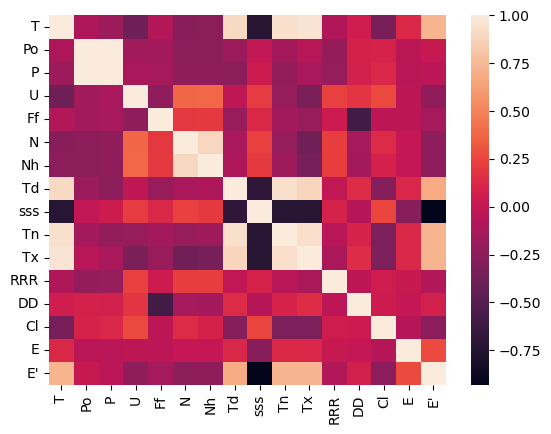

In [836]:
sns.heatmap(data.corr(method='spearman'))

In [837]:
data.corr(method='spearman')

,T,Po,P,U,Ff,N,Nh,Td,sss,Tn,Tx,RRR,DD,Cl,E,E'
T,1.000000,-0.108332,-0.179938,-0.391654,-0.084237,-0.270065,-0.250590,0.904128,-0.730582,0.941591,0.955786,-0.100263,0.051976,-0.337592,0.123354,0.724810
Po,-0.108332,1.000000,0.995664,-0.159608,-0.142903,-0.258676,-0.252486,-0.188170,-0.018593,-0.151832,-0.062454,-0.212548,0.082764,0.091436,-0.048685,0.011352
P,-0.179938,0.995664,1.000000,-0.128241,-0.136661,-0.236204,-0.232105,-0.252653,0.034109,-0.219019,-0.131049,-0.204178,0.078808,0.115382,-0.053352,-0.040345
U,-0.391654,-0.159608,-0.128241,1.000000,-0.236129,0.377350,0.384855,-0.019594,0.213061,-0.203985,-0.324469,0.232354,0.180149,0.263687,-0.026728,-0.236917
Ff,-0.084237,-0.142903,-0.136661,-0.236129,1.000000,0.197595,0.205786,-0.195234,0.123601,-0.141017,-0.197782,0.036204,-0.586192,-0.033962,-0.037620,-0.132330
N,-0.270065,-0.258676,-0.236204,0.377350,0.197595,1.000000,0.896405,-0.128857,0.228427,-0.202275,-0.368553,0.218111,-0.137462,0.135557,-0.002803,-0.244840
Nh,-0.250590,-0.252486,-0.232105,0.384855,0.205786,0.896405,1.000000,-0.103230,0.207442,-0.174850,-0.350791,0.219142,-0.150476,0.086546,-0.002894,-0.230322
Td,0.904128,-0.188170,-0.252653,-0.019594,-0.195234,-0.128857,-0.103230,1.000000,-0.686806,0.944678,0.892514,-0.014124,0.136333,-0.282091,0.110408,0.675794
sss,-0.730582,-0.018593,0.034109,0.213061,0.123601,0.228427,0.207442,-0.686806,1.000000,-0.731610,-0.732149,0.092824,-0.071418,0.250519,-0.274217,-0.932084
Tn,0.941591,-0.151832,-0.219019,-0.203985,-0.141017,-0.202275,-0.174850,0.944678,-0.731610,1.000000,0.932331,-0.049950,0.092717,-0.320011,0.117399,0.726592


Из новых взаимосвязей я выделю связи, которые превышают хотя бы 0.3: 1) T, Tn, Tx, Td (температура) и sss, E' (снег и характеристика снега) 2) U и T, N 3)Ff и DD (скорость ветра и его направление) Это вполне логично, т.к. температура обусловливает наличие или отсутствие снега, а вот связь влажности, температуры и облачности объяснить сложнее, хотя она и не так сильна (связь слабая, всего 0.4). Также связь скорости ветра и его направления довольно интересна, видимо существуют определенные направления, в которых ветер дует сильнее и наоборот. В принципе взаимосвязи не выходят за рамки адекватности, поэтому кодировка Label неплохо подошла, однако я бы хотел юзнуть и другой вариант.

In [838]:
onehotencoder = OneHotEncoder()
encoder = onehotencoder.fit_transform(saved_data[['DD', 'Cl', 'E', name]])
encoder = pd.DataFrame(encoder.toarray(), columns=onehotencoder.get_feature_names_out())

In [839]:
saved_data[onehotencoder.get_feature_names_out()] = encoder.values
saved_data.drop(cat_columns, axis=1, inplace=True)

In [843]:
saved_data.corr()

,T,Po,P,U,Ff,N,Nh,Td,sss,Tn,...,E_Затопленная водой.,E_Осадков нет,E_Поверхность почвы влажная.,E_Поверхность почвы замерзшая.,E_Поверхность почвы сырая (вода застаивается на поверхности и образует малые или большие лужи).,E'_Ровный слой слежавшегося или мокрого снега покрывает поверхность почвы полностью.,E'_Ровный слой сухого рассыпчатого снега покрывает поверхность почвы полностью.,"E'_Слежавшийся или мокрый снег (со льдом или без него), покрывающий менее половины поверхности почвы.","E'_Слежавшийся или мокрый снег (со льдом или без него), покрывающий по крайней мере половину поверхности почвы, но почва не покрыта полностью.",E'_снега нет
T,1.000000,-0.126354,-0.199707,-0.447731,-0.067111,-0.164700,-0.197445,0.902862,-0.577024,0.936265,...,0.055098,-0.479397,0.302102,-0.069382,0.101048,-0.283631,-0.602320,-0.091626,-0.075850,0.725617
Po,-0.126354,1.000000,0.996348,-0.156090,-0.144310,-0.279259,-0.264863,-0.212578,-0.032810,-0.178541,...,-0.052154,-0.021217,0.031735,0.112223,-0.101806,-0.085258,0.050068,0.068978,0.014282,-0.006183
P,-0.199707,0.996348,1.000000,-0.122557,-0.137402,-0.264563,-0.248629,-0.278767,0.010026,-0.247306,...,-0.055999,0.012644,0.009817,0.116477,-0.107730,-0.063997,0.095455,0.075201,0.020414,-0.060660
U,-0.447731,-0.156090,-0.122557,1.000000,-0.226669,0.301946,0.357426,-0.029158,0.162281,-0.219890,...,-0.021325,0.293328,-0.176059,-0.054706,0.009517,0.166378,0.171925,-0.028440,0.022884,-0.249606
Ff,-0.067111,-0.144310,-0.137402,-0.226669,1.000000,0.199415,0.206234,-0.180343,0.092192,-0.119162,...,0.006085,0.114758,-0.095404,-0.001234,-0.002516,0.085616,0.066793,0.016192,0.010758,-0.122941
N,-0.164700,-0.279259,-0.264563,0.301946,0.199415,1.000000,0.856088,-0.042097,0.115081,-0.096289,...,0.016715,0.160732,-0.097591,-0.064318,0.055496,0.151472,0.083674,-0.036460,0.034665,-0.171999
Nh,-0.197445,-0.264863,-0.248629,0.357426,0.206234,0.856088,1.000000,-0.053769,0.126013,-0.111244,...,0.025242,0.188040,-0.121202,-0.075257,0.057055,0.177896,0.085199,-0.037946,0.029638,-0.190289
Td,0.902862,-0.212578,-0.278767,-0.029158,-0.180343,-0.042097,-0.053769,1.000000,-0.568645,0.945781,...,0.051932,-0.395172,0.257547,-0.099320,0.119887,-0.242744,-0.595717,-0.112136,-0.073776,0.697677
sss,-0.577024,-0.032810,0.010026,0.162281,0.092192,0.115081,0.126013,-0.568645,1.000000,-0.603246,...,-0.068108,0.431537,-0.270547,-0.064307,-0.159659,0.408530,0.583097,-0.084791,-0.020407,-0.706147
Tn,0.936265,-0.178541,-0.247306,-0.219890,-0.119162,-0.096289,-0.111244,0.945781,-0.603246,1.000000,...,0.061316,-0.463278,0.291108,-0.088289,0.126839,-0.258304,-0.639946,-0.101180,-0.069936,0.737587


In [842]:
saved_data.corr(method='spearman').nlargest(10, 'Ff')['Ff']

Ff                                          1.000000
DD_Ветер, дующий с севера                   0.234000
Nh                                          0.205786
N                                           0.197595
DD_Ветер, дующий с северо-северо-запада     0.185370
DD_Ветер, дующий с юго-юго-востока          0.180232
DD_Ветер, дующий с северо-запада            0.140741
DD_Ветер, дующий с северо-северо-востока    0.130188
sss                                         0.123601
E_Осадков нет                               0.119196
Name: Ff, dtype: float64

Ну, корреляционную таблицу я получил, но как в ней найти что-то стоящее я без понятия, т.к. визуально все это перебирать слишком долго, да и смысла в этом вероятно будет не очень много (разве что пойму, какое все-таки направление ветра сильнее коррелирует с его скоростью. Ответ : ветер, дующий с севера (´･ᴗ･ ` )). Оставлю эту таблицу с кучей бинарно закодированных категориальных признаков для машинного обучения, где большое количество признаков может улучшить качество модели. 

Подводя итоги по этому разделу стоит отметить, что я провел описание всех признаков и основыне их тенденции, поработал с выбросами и рассмотрел попарные корреляции признаков. Благодаря этому я нашел идею для машинного обучения, в котором попытаюсь предсказывать влажность по остальным признакам, т.к. корреляционная матрица показала, что U сильнее всего зависит от других показателей (не считая очевидных корреляций температурных признаков). Касательно создания новых признаков, то тут сложнее, т.к. я с самого начала уже знал, какие гипотезы буду проверять, а именно погодные приметы. Их, очевидно, никак нельзя разглядеть в графиках, гистограммах и корреляциях, т.к. почти все погодные приметы по конкретным датам делают (ведают) прогноз на промежутки времени (смотри гипотезы, где я выбрал целых 5 примет! (так-то не очень много)), а то как эти даты и промежутки вибирали древние русы только одни Перун и профессор Рыбников знают (ведают). Поэтому, новые признаки я буду создавать с целью упрощения проверки своих гипотез, т.к. эти признаки все равно надо было бы создать.

# Раздел 4. Создание новых признаков

# Раздел 5. Гипотезы

Как и обещал, 5 примет в студию. Но сначала немного о приметах в общем и методологии работы с ними. Формулировки примет я нашел в книжке Г. Д. Рыженкова «Народный месяцеслов: Пословицы, поговорки, приметы, присловья о временах года и о погоде», отлично чтиво, всем советую. Выбрав самые интересные пословицы стоит понять, как проверять их истинность. Поскольку приметы были сформулированы до перехода на григорианский календарь, то для расчетов я ([сайтик перевода дат](http://graecolatini.bsu.by/htm-different/date-converter.htm)) их переведу в старый стиль. 
Обычно, как я уже упоминал в конце 3-го раздела, приметы подразумевают сравнение погоды в како-то день и период времен — например, «Что Казанская покажет, то и зима скажет». Однако по каким критериям стоит сравнивать этот день с зимой? Я использую четыре основных погодных параметра, которые присутствуют в моей таблице: температура, скорость ветра, облачность и наличие осадков. Тёплыми и ветреными днями я считаю те, в которые соответственно температура и скорость ветра были выше средних значений в соответствующий месяц. Ясными — когда средняя облачность не превышала 40%, снежными или дождливыми — когда суммарное количество осадков в дневное время превышало 0,5 мм. Основные моменты я обозначил, перейду к самим пословицам. Буду выделять их в отдельные подзаголовки, для большей понятности и крутости. 

## 1. Какова Аксинья, такова и весна (Аксинья Весноуказательница)
Выполняется, если характеристики 24 января по характеру совпадают с последующей весной.

## 2. На сретенье снежок - весной дожжок (Сретенье)
Выпоняется, если 2 февраля осадки и весной больше обычного дней с осадками.

## 3. На Мокия мокро - все лето мокро, на Мокия сухо - все лето сухо (Мокий Мокрый)
Выполняется, если 11 мая было сухо и лето было более сухим или, если 11 мая было сыро и лето было более сырое

## 4. Что Казанская покажет, то и зима скажет (Казанская икона Богоматери)
Выполняется, если характеристики 22 октября по всем 4 параметрам совпадают со средними параметрами следующей зимы

## 5. На Самсона дождь - семь недель то ж (Самсон Сеногной)
Выполнятся, если 27 июня было дождливо и затем с 28 июня по 15 августа дождливость была выше среднего.

# Раздел 6. Машинное обучение

Как и писал в конце 3 раздела, в разделе машинного обучения я буду предсказывать показатель влажности по остальным пременным. В качестве регрессионной модели я буду использовать линейную регрессию, т.к. влажность - $\underline{nonbinary}$ признак (ну все, шутки в сторону (￢‿￢ )).

In [50]:
#numdata.iloc[numdata['Ff'].isnull().values]
#data.loc[list(data.index[:2])]
#data.loc[[(2023, 5, 7, 21)]]
#sns.pairplot(daydata)